<a href="https://colab.research.google.com/github/azfarkhoja305/GANs/blob/training-loop/notebooks/DC_GAN_CIFAR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Tue Apr  6 17:53:11 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.67       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P0    35W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

DC GAN adopted from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

Calculates FID score in PyTorch

In [2]:
import os
import sys
from pathlib import Path
import pdb

Path.ls = lambda x: list(x.iterdir())

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchsummary import summary

In [4]:
!git clone https://github.com/azfarkhoja305/GANs.git

fatal: destination path 'GANs' already exists and is not an empty directory.


In [5]:
if Path('./GANs').exists():
    sys.path.insert(0,'./GANs')

In [6]:
!python ./GANs/create_fid_stats.py -d cifar_10 -t False

Namespace(batch_size=256, dataset='cifar_10', save='fid_stats', train='False')
Files already downloaded and verified
fid_stats/cifar_10_valid_fid_stats.npz exists. Exiting !!!


In [7]:
from datasets import ImageDataset
from utils.utils import check_gpu, display_images

In [8]:
%load_ext autoreload
%autoreload 2

In [9]:
device = check_gpu()
print(f'Using device: {device}')

Using device: cuda


In [10]:
batch_sz = 64
dataset =  ImageDataset('cifar_10', batch_sz=batch_sz)

Files already downloaded and verified


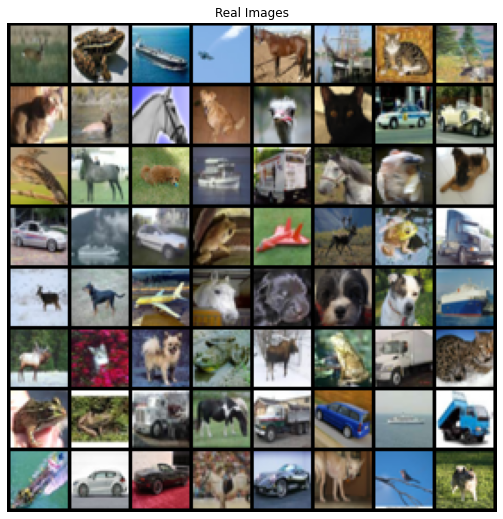

In [11]:
display_images(dataset.train_loader)

In [12]:
# from models.generator import Generator
# Gen = Generator().to(device)
# # summary(Gen,(128,1))

In [13]:
from models.transformer_generator import TGenerator
latent_dims=1024
Gen = TGenerator(latent_dims=latent_dims).to(device)
# summary(Gen,(latent_dims,))

In [14]:
# ViT Discriminator
from models.ViT_discriminator import Discriminator
from types import SimpleNamespace
args = SimpleNamespace(**{"d_depth": 7, "df_dim": 384, "img_size": 32, "patch_size": 8})
Dis = Discriminator(args).to(device)
# summary(Dis,(3,32,32,))

In [15]:
loss_fn = nn.BCEWithLogitsLoss()
fixed_noise = torch.randn(batch_sz, latent_dims, device=device)
real_label = 1.
fake_label = 0.
lr,beta1 = 3e-4, 0
optG = optim.AdamW(Gen.parameters(), lr=lr, betas=(beta1, 0.999))
optD = optim.AdamW(Dis.parameters(), lr=lr, betas=(beta1, 0.999))

In [16]:
img_list = []
G_losses = []
D_losses = []
iters = 0

# Number of training epochs
num_epochs = 30

In [17]:
from utils.loss import wgangp_eps_loss

for epoch in range(num_epochs):
    for i, data in enumerate(dataset.train_loader):

        ## Train with all-real batch
        Dis.zero_grad()
        # Format batch
        real = data[0].to(device)
        b_size = real.size(0)
        real_validity = torch.full(
            (b_size,), real_label, dtype=torch.float, device=device
        )
        # Forward pass real batch through D
        output_real = Dis(real).view(-1)

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, latent_dims, device=device)
        # Generate fake image batch with G
        fake = Gen(noise)
        fake_validity = torch.full_like(real_validity, fake_label)
        # Classify all fake batch with D
        output_fake = Dis(fake.detach()).view(-1)

        errD = wgangp_eps_loss(Dis, real, fake, 1.0, output_real, output_fake)

        errD.backward()

        torch.nn.utils.clip_grad_norm_(Dis.parameters(), 5.0)

        # Update D
        optD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        Gen.zero_grad()
        label = torch.full_like(
            real_validity, real_label
        )  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = Dis(fake).view(-1)
        # Calculate G's loss based on this output
        errG = loss_fn(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = torch.sigmoid(output).mean().item()
        # Update G
        optG.step()

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())


        # Output training stats
        if (i+1) %100 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                % (epoch, num_epochs, i, len(dataset.train_loader),
                     errD.item(), errG.item()))

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataset.train_loader)-1)):
            with torch.no_grad():
                fake = Gen(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters +=1
      

    # _, axs = plt.subplots(1,2,figsize=(15,15))
    # display_images(dataset.train_loader,ax = axs[0])
    # display_images(img_list, ax = axs[1])
    # plt.tight_layout()
             

[0/30][99/782]	Loss_D: 14.7575	Loss_G: 6.0564
[0/30][199/782]	Loss_D: -11.3567	Loss_G: 15.2112
[0/30][299/782]	Loss_D: -2.2889	Loss_G: 1.9608
[0/30][399/782]	Loss_D: -0.9815	Loss_G: 0.6641
[0/30][499/782]	Loss_D: -1.3222	Loss_G: 1.3830
[0/30][599/782]	Loss_D: 0.4123	Loss_G: 1.3350
[0/30][699/782]	Loss_D: 1.9678	Loss_G: 0.7946
[1/30][99/782]	Loss_D: -0.6086	Loss_G: 1.4330
[1/30][199/782]	Loss_D: -0.3293	Loss_G: 1.8886
[1/30][299/782]	Loss_D: -1.0852	Loss_G: 2.2824
[1/30][399/782]	Loss_D: -0.8323	Loss_G: 1.3428
[1/30][499/782]	Loss_D: -0.7179	Loss_G: 2.1328
[1/30][599/782]	Loss_D: -0.2434	Loss_G: 1.6319
[1/30][699/782]	Loss_D: -0.4053	Loss_G: 1.1500
[2/30][99/782]	Loss_D: -0.3592	Loss_G: 0.9061
[2/30][199/782]	Loss_D: 1.7315	Loss_G: 0.9878
[2/30][299/782]	Loss_D: -0.0828	Loss_G: 1.1008
[2/30][399/782]	Loss_D: -0.0796	Loss_G: 1.5564
[2/30][499/782]	Loss_D: 0.7004	Loss_G: 1.0053
[2/30][599/782]	Loss_D: -0.2199	Loss_G: 1.4299
[2/30][699/782]	Loss_D: -0.2440	Loss_G: 1.0819
[3/30][99/782]	Los

KeyboardInterrupt: ignored

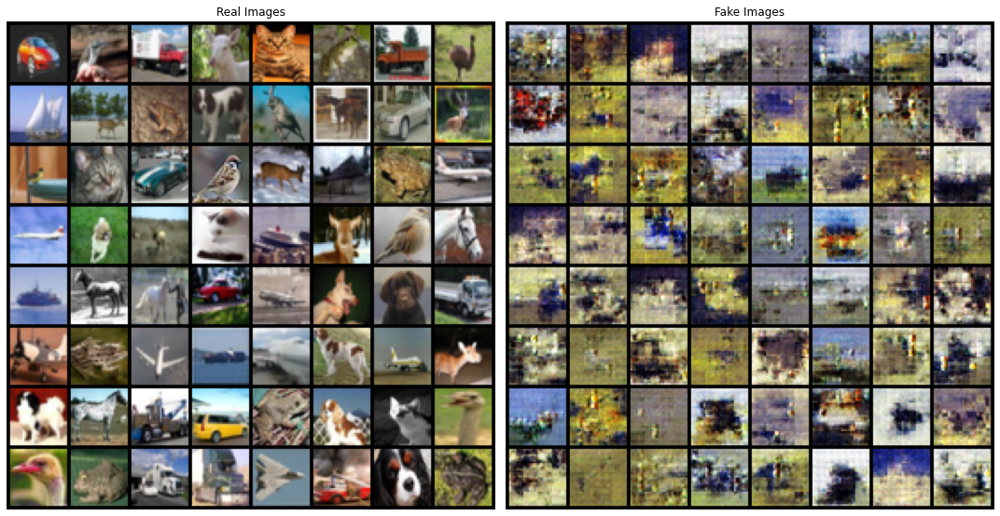

In [18]:
_, axs = plt.subplots(1,2,figsize=(15,15))
display_images(dataset.train_loader,ax = axs[0])
display_images(img_list, ax = axs[1])
plt.tight_layout()

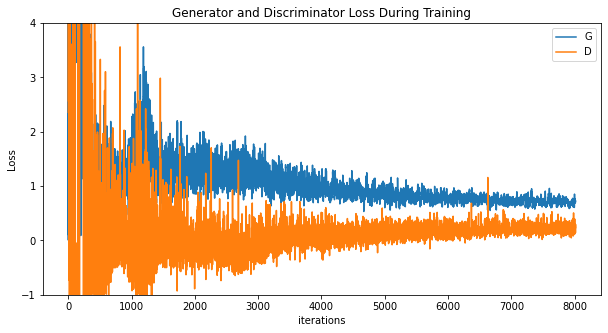

In [25]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.ylim([-1,4])
plt.legend()
plt.show()

Calculating FID Score

In [21]:
from metrics.torch_is_fid_score import is_fid_from_generator
stat_path = Path('fid_stats/cifar_10_valid_fid_stats.npz')
inception_score, fid = is_fid_from_generator(generator=Gen,
                                        latent_dims=latent_dims,
                                        num_imgs=10000,
                                        batch_sz=256,
                                        fid_stat_path = stat_path)

In [22]:
print(f"\nFID score: {fid}")
print(f"\nIS: {inception_score}")


FID score: 186.1797637939453

IS: (2.634939670562744, 0.0520055890083313)


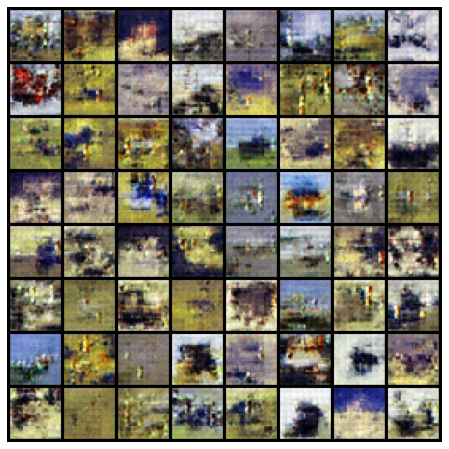

In [23]:
rc('animation', html='jshtml')
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
ani